# Example 2: Understanding the inputs and the output trace

In this notebook, we will discuss more in detail the inputs and the output trace of the VBMC algorithm, including a discussion on how to set parameter bounds and starting point. We also describe the items in the output trace, and display the evolution of the variational posterior in each iteration.

This notebook is Part 2 of a series of notebooks in which we present various example usages for VBMC with the `pyvbmc` package.

In [1]:
import numpy as np
import scipy.stats as scs
from pyvbmc.vbmc import VBMC

## 1. Model definition: log likelihood, log prior, and log joint

We use the same toy target function as in Example 1, a broad [Rosenbrock's banana function](https://en.wikipedia.org/wiki/Rosenbrock_function) in $D = 2$.

In [2]:
D = 2  # still in 2-D

# log likelihood (Rosenbrock)
def llfun(x):
    x = np.atleast_2d(x)
    return -np.sum(
        (x[0, :-1] ** 2.0 - x[0, 1:]) ** 2.0 + (x[0, :-1] - 1) ** 2.0 / 100
    )

To make the problem more interesting, we will assume parameters to be constrained to be positive, that is $x_d > 0$ for $1 \le d \le D$. 

Since parameters are strictly positive, we impose an independent exponential prior on each variable (again, you could choose here whatever you want). We then define the log joint (our target) as log likelihood plus log prior.

In [3]:
prior_tau = 3 * np.ones((1, D))  # Length scale of the exponential prior
lpriorfun = lambda x: np.sum(scs.expon.logpdf(x, scale=prior_tau))

target = lambda x: llfun(x) + lpriorfun(x)  # Log-joint

## 2. Parameter setup: bounds and starting point


### Choosing parameter bounds

Bound settings require some discussion:

  1) the specified (hard) bounds are **not** included in the domain, so in this case, since we want to be the parameters to be positive, we can set the lower bounds `LB = 0`,  knowing that the parameter will always be greater than zero.

In [4]:
LB = np.zeros((1, D))  # Lower bounds

  2) Currently, VBMC does not support half-bounds, so we need to specify a finite upper bound (cannot be `inf`). We pick something very large according to our prior. However, do not go crazy here by picking something impossibly large, otherwise VBMC will likely fail.

In [5]:
UB = 10 * prior_tau  # Upper bounds

  3) Plausible bounds need to be meaningfully different from the hard bounds, so here we cannot set the plausible lower bounds `PLB = 0`. We follow the same strategy as the first example, by picking the top ~68% credible interval of the prior.

In [6]:
PLB = scs.expon.ppf(0.159, scale=prior_tau)
PUB = scs.expon.ppf(0.841, scale=prior_tau)

### Choosing the starting point

Good practice is to initialize VBMC in a region of high posterior density.

- With no additional information, *uninformed* approaches to choose the starting point $\mathbf{x}_0$ include picking the mode of the prior, or, if you need multiple points, a random draw from the prior or a random point uniformly chosen inside the plausible box. None of these approaches is particularly recommended, though, especially when facing more difficult problems.
- It is generally better to adopt an *informed* starting point $\mathbf{x}_0$. A good choice is typically a point in the approximate vicinity of the mode of the posterior (no need to start exactly at the mode). Clearly, it is hard to know in advance the location of the mode, but a common approach is to run a few optimization steps on the target (starting from one of the uninformed options above).

For this example, we cheat and start in the proximity of the mode, exploiting our knowledge of the toy likelihood, for which we know the location of the maximum.

In [7]:
x0 = np.ones((1, D))  # Optimum of the Rosenbrock function

## 3. Initialize and run inference

Finally, we initialize and run VBMC. 

### Output trace

In each iteration, the VBMC output trace prints the following information:

- `Iteration`: iteration number (starting from 0, which follows the initial design).
- `f-count`: total number of the `target` function evaluations so far.
- `Mean[ELBO]`: Estimated mean of the `elbo`.
- `Std[ELBO]`: Standard deviation of the estimated `elbo`.
- `sKL-iter[q]`: Gaussianized symmetrized [Kullback-Leibler divergence](https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence) between the variational posterior in the previous and current iteration. In brief, a measure of how much the variational posterior $q$ changes between iterations.
- `K[q]`: Number of mixture components of the variational posterior.
- `Convergence`: A number that summarizes the stability of the current solution, by weighing various factors such as the change in the `elbo` and in the variational posterior across iterations, and the uncertainty in the `elbo`. Values (much) less than 1 correspond to a stable solution and thus suggest convergence of the algorithm.
- `Action`: Major actions taken by the algorithm in the current iteration. Common actions/events are: 
  - `start warm-up` and `end warm-up`: start and end of the initial warm-up stage;
  - `rotoscale` (and `undo rotoscale`): rotate and re-scale the inference space to make inference more tractable (undo the rotoscaling if there is no significant improvement);
  - `trim data`: remove some points to increase stability;
  - `stable`: solution stable for multiple iteration;
  - `finalize`: refine the variational approximation with additional mixture components.

### Iteration plotting

In this example, we also switch on the plotting of the current variational posterior at each iteration with the user option `plot`. Regarding the iteration plots:

- Each iteration plot shows the multidimensional variational posterior in the current iteration via one- and two-dimensional marginal plots for each variable and pairs of variables, as you would get from `vp.plot()` (see also Example 1).
- In each plot, blue circles represent points in the training set of the GP surrogate model, and orange dots are points added to the training set in this iteration. 
- The red crosses are the centers of the variational mixture components.
- Since VBMC with plotting on can occupy a lot of space on the notebook, remember that in Jupyter notebook you can toggle the scrolling on and off via the "Cell > Current Outputs > Toggle Scrolling" and "Cell > All Output > Toggle Scrolling" menus.

In [8]:
# initialize VBMC
user_options = {"plot": True}
vbmc = VBMC(target, x0, LB, UB, PLB, PUB, user_options)
# Printing will give a summary of the vbmc object:
# bounds, user options, etc.:
print(vbmc)

VBMC:
    dimension = 2,
    x0: [[-0.2366, -0.2366]] : ndarray,
    lower bounds: [[0., 0.]] : ndarray,
    upper bounds: [[30., 30.]] : ndarray,
    plausible lower bounds: [[0.5195, 0.5195]] : ndarray,
    plausible upper bounds: [[5.5166, 5.5166]] : ndarray,
    log-density = <function <lambda> at 0x7f45e08cfdc0>,
    log-prior = None,
    prior sampler = None,
    variational posterior = VariationalPosterior:
        dimension = 2,
        num. components = 2,
        means: 
            [[1., 1.],
             [1., 1.]] : ndarray,
        weights: [[0.5, 0.5]] : ndarray,
        sigma (per-component scale): [[0.001, 0.001]] : ndarray,
        lambda (per-dimension scale): 
            [[1.],
             [1.]] : ndarray,
        stats = None,
    Gaussian process = None,
    user options = User Options:
        plot: True (Plot marginals of variational posterior at each iteration)


Beginning variational optimization assuming EXACT observations of the log-joint.
 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     0         10          -7.16         8.88    306973.35        2        inf     start warm-up


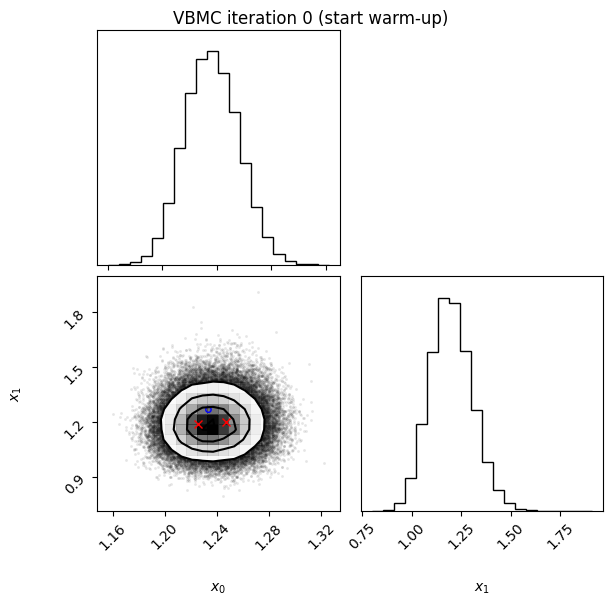

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     1         15           4.95         6.18       639.70        2        inf     


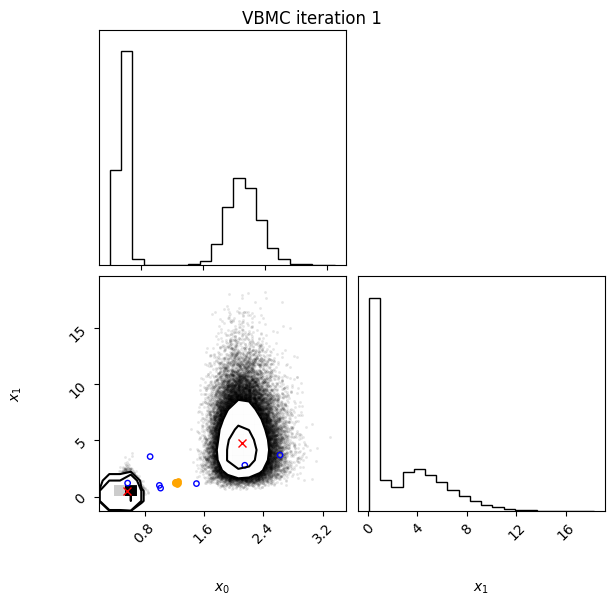

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     2         20          -1.87         3.57         3.20        2        110     


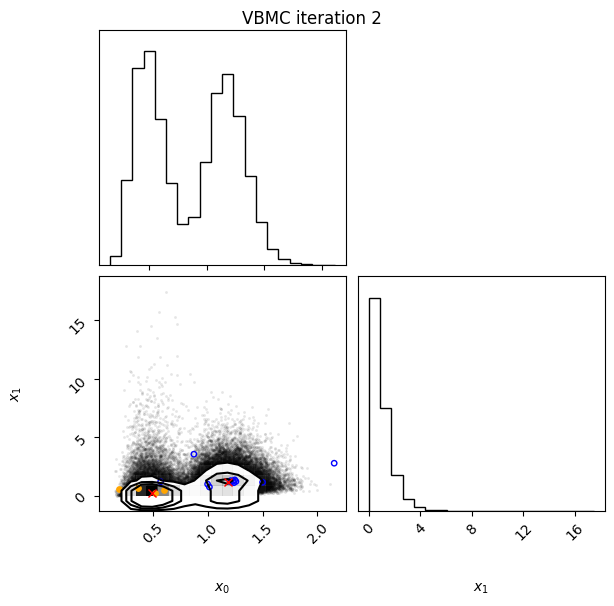

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     3         25          -2.37         0.14         0.12        2       4.87     


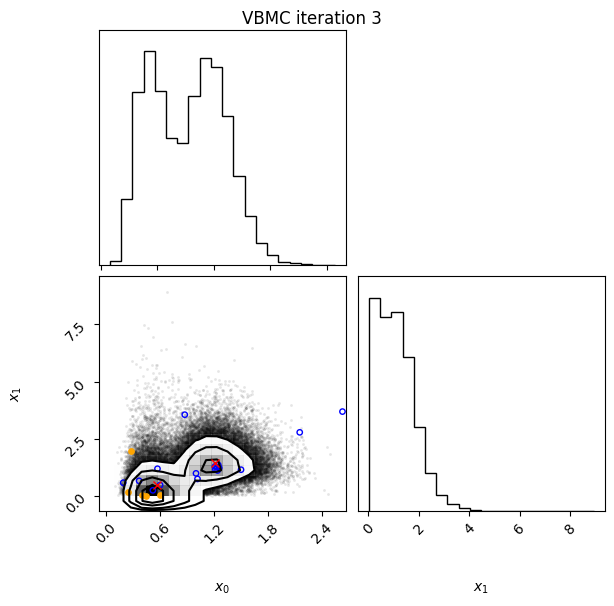

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     4         30          -2.44         0.07         0.01        2       0.59     


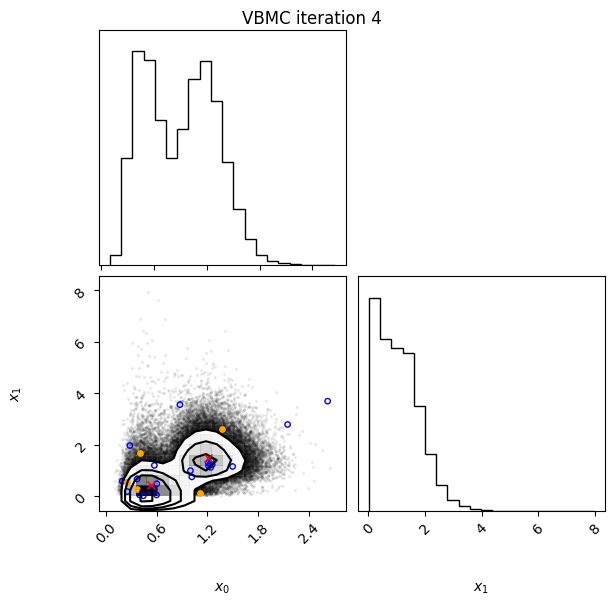

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     5         35          -2.33         0.02         0.03        2       1.14     


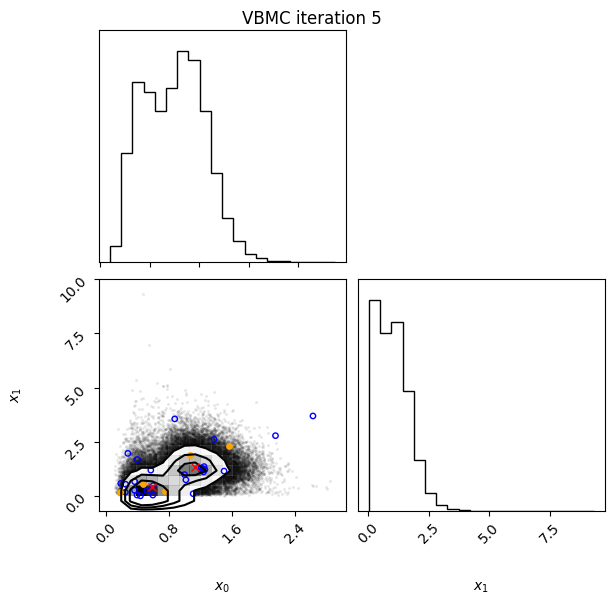

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     6         40          -2.37         0.02         0.01        2      0.413     end warm-up


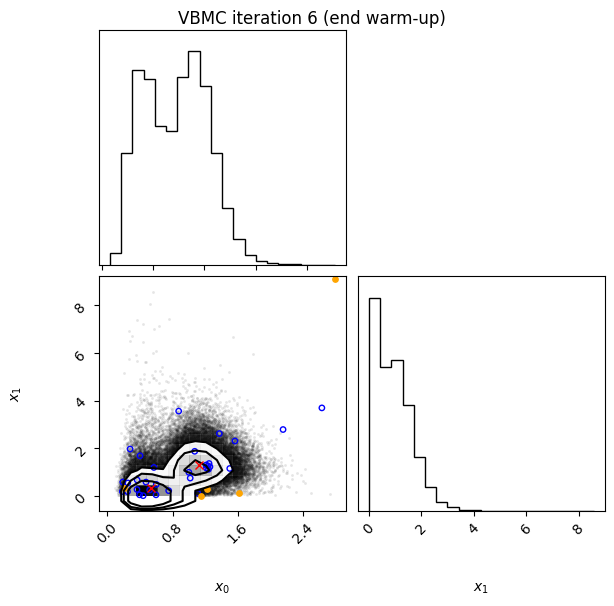

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     7         45          -2.32         0.01         0.01        2      0.444     


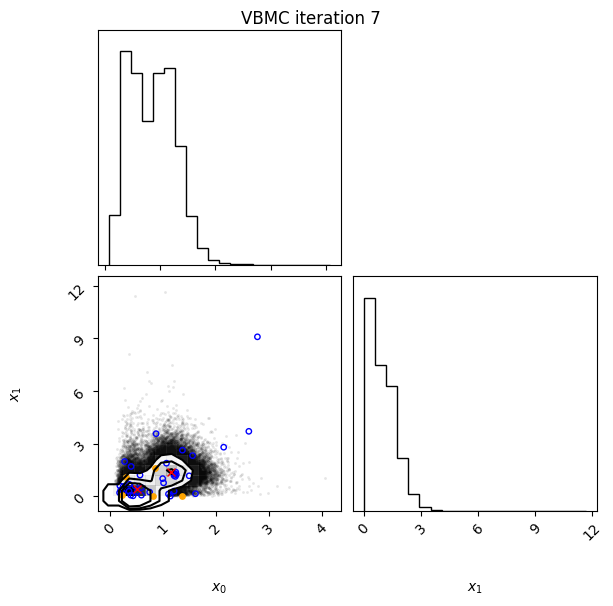

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     8         50          -2.30         0.04         0.01        2      0.335     


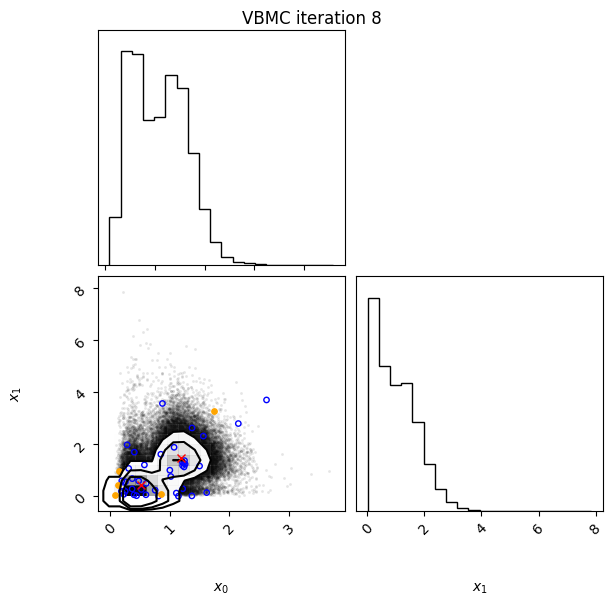

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
     9         55          -2.09         0.02         0.02        5       1.37     


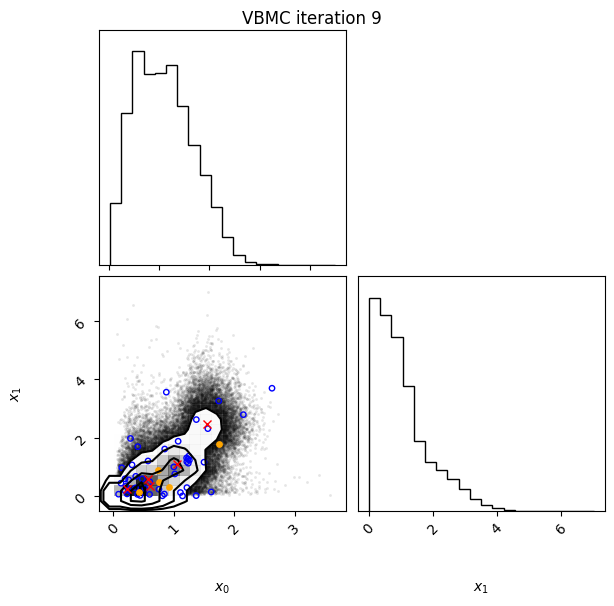

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    10         60          -1.99         0.06         0.12        6       3.35     rotoscale, undo rotoscale


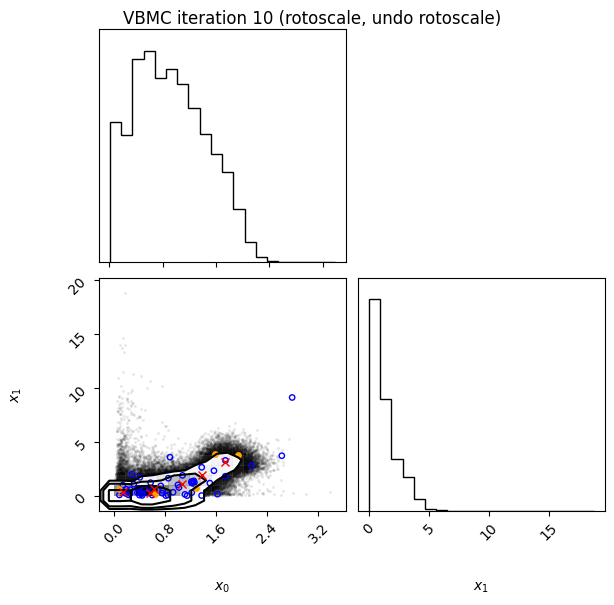

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    11         65          -1.90         0.11         0.12        6       3.59     


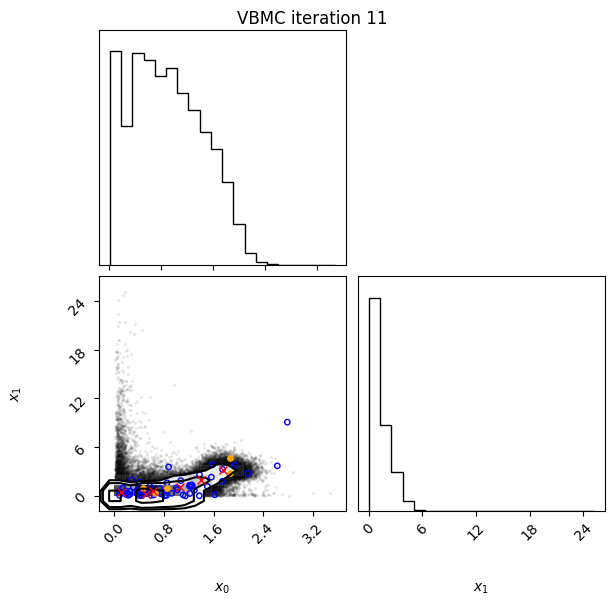

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    12         70          -1.74         0.34         0.57        6       15.1     


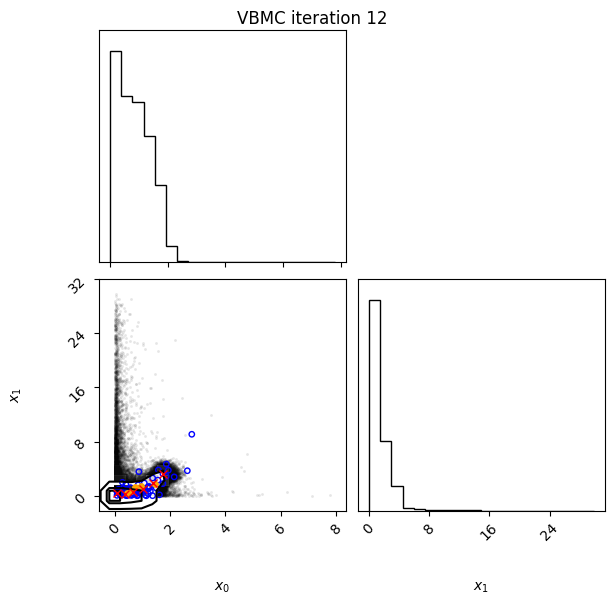

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    13         75          -2.00         0.09         0.83        6       20.9     


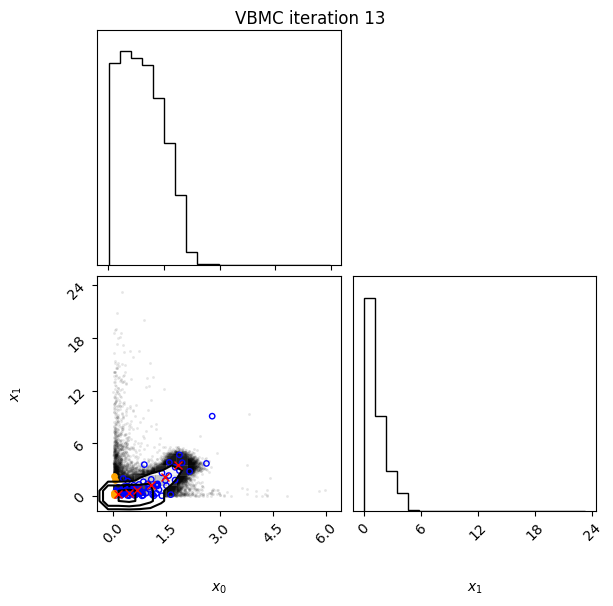

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    14         80          -1.98         0.05         0.04        6       1.12     


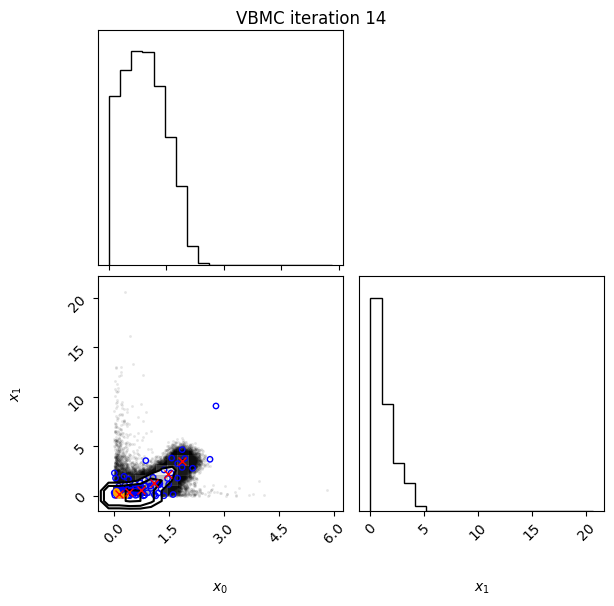

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    15         85          -1.99         0.06         0.03        7       1.05     


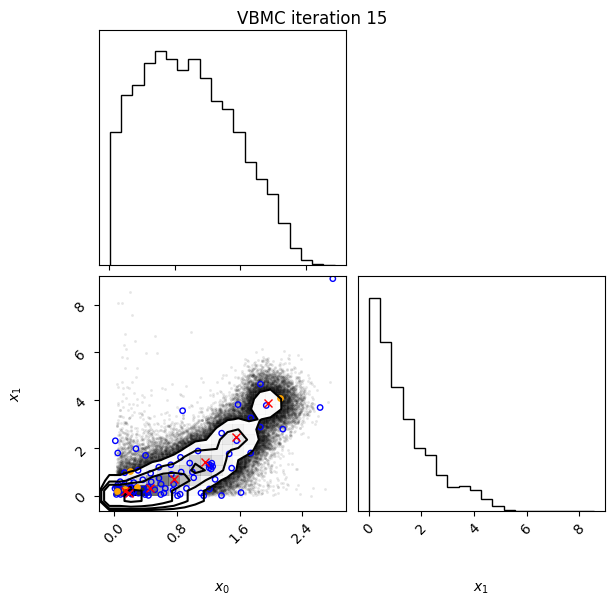

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    16         90          -1.99         0.00         0.00        7     0.0415     


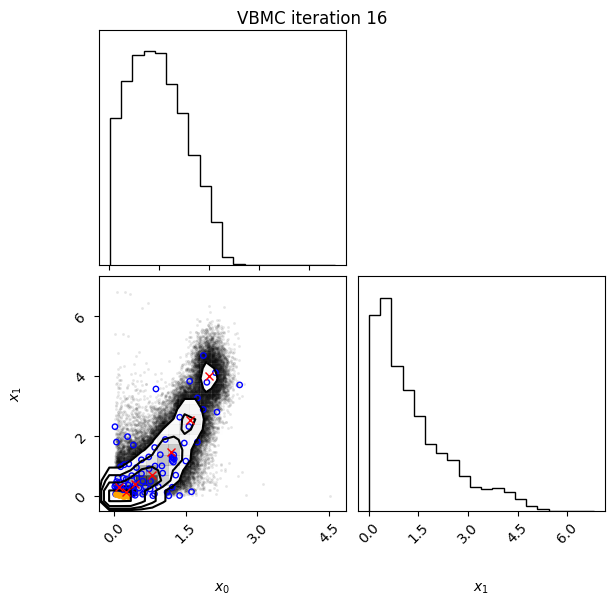

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    17         95          -1.96         0.00         0.00       10       0.13     


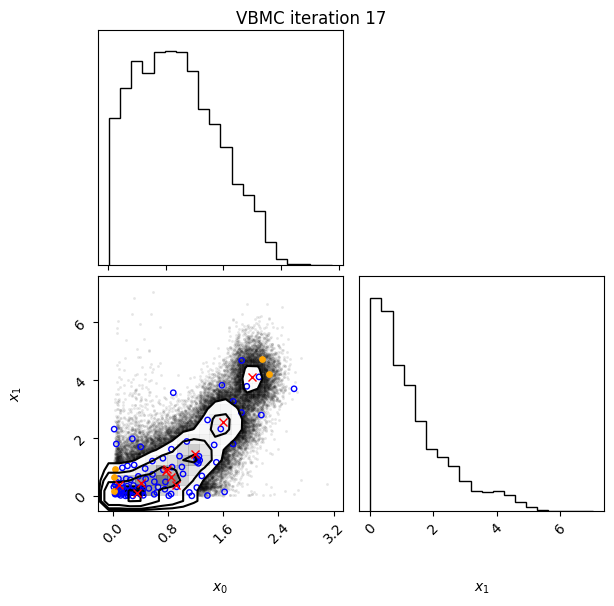

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    18        100          -1.93         0.00         0.00       13      0.142     


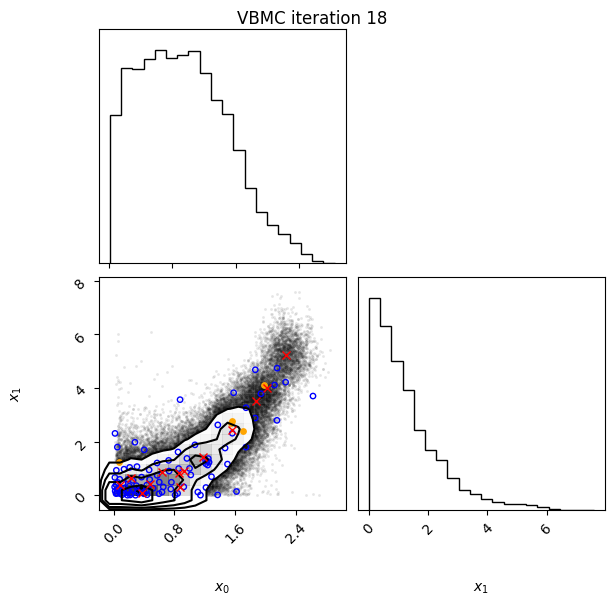

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    19        105          -1.91         0.00         0.02       16      0.635     


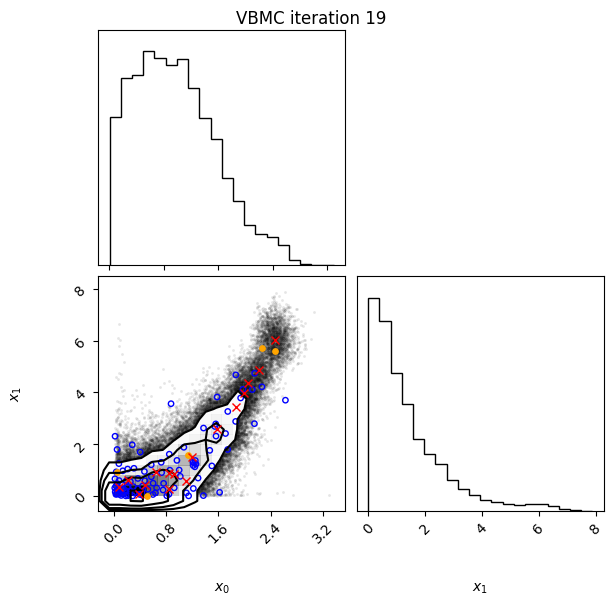

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    20        110          -1.90         0.00         0.00       19     0.0671     


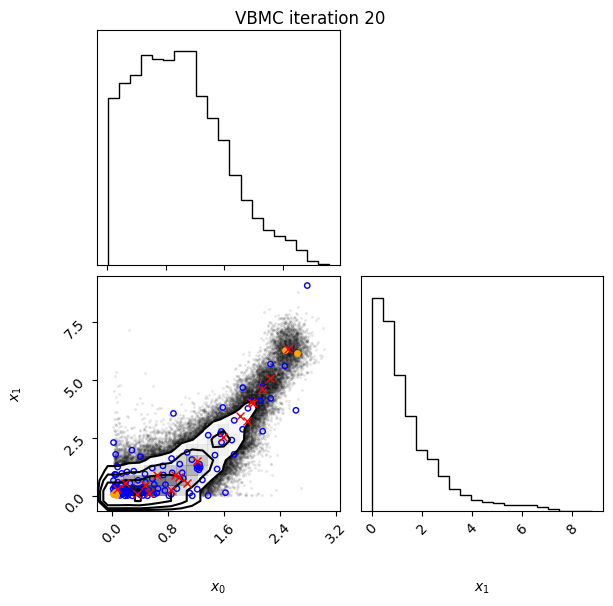

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    21        115          -1.90         0.00         0.00       19     0.0195     rotoscale, undo rotoscale


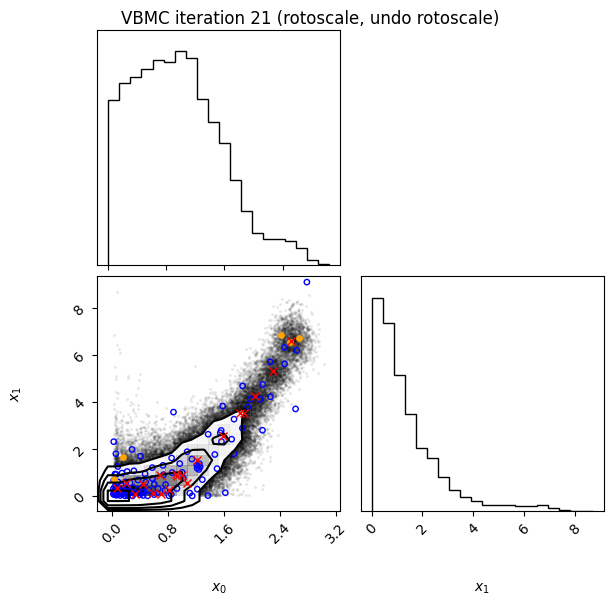

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    22        120          -1.88         0.00         0.00       19     0.0867     


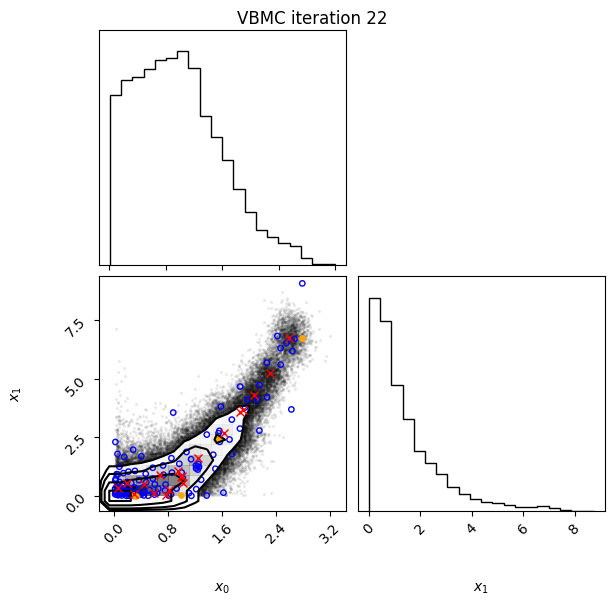

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    23        125          -1.89         0.00         0.00       20     0.0261     


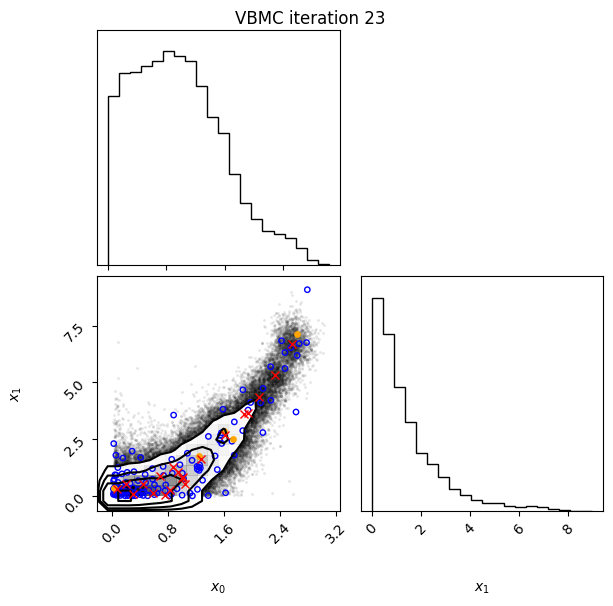

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    24        130          -1.89         0.00         0.00       20     0.0316     


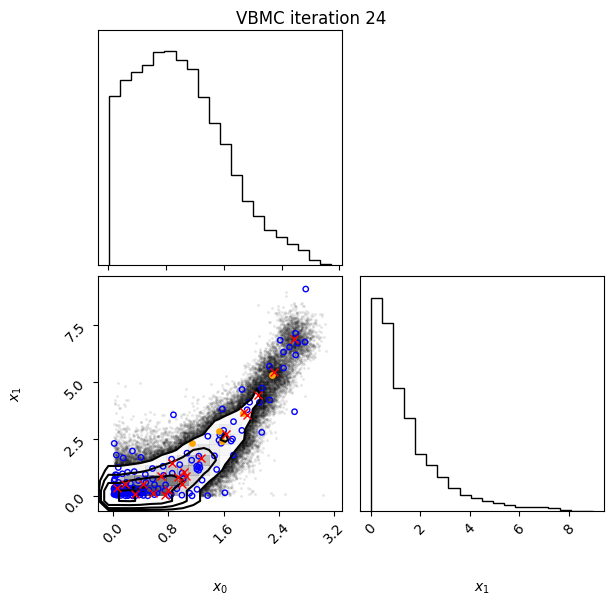

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
    25        135          -1.89         0.00         0.00       20     0.0447     stable


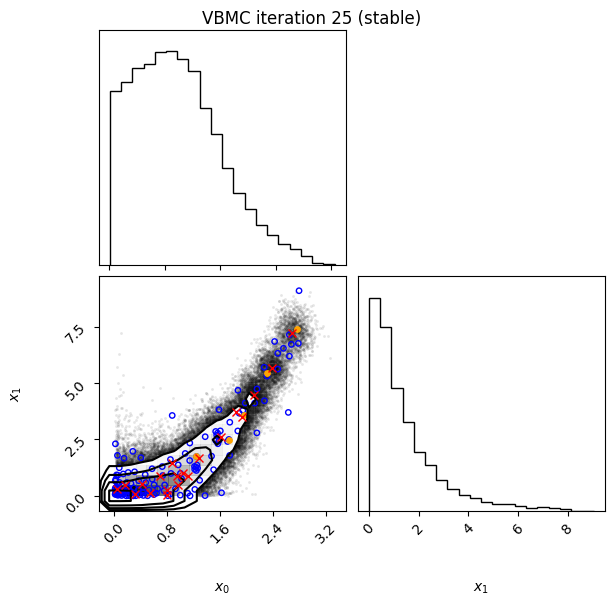

 Iteration  f-count    Mean[ELBO]    Std[ELBO]    sKL-iter[q]   K[q]  Convergence  Action
   inf        135          -1.87         0.00         0.00       50     0.0447     finalize


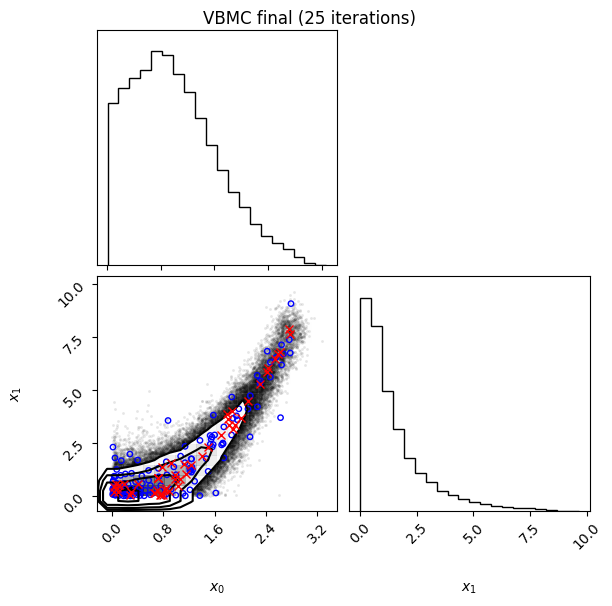

Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: -1.868 +/-0.003.


In [9]:
# run VBMC
vp, elbo, elbo_sd, _, _ = vbmc.optimize()

In [10]:
lml_true = -1.836  # ground truth, which we know for this toy scenario

print("The true log model evidence is:", lml_true)
print("The obtained ELBO is:", format(elbo, ".3f"))
print("The obtained ELBO_SD is:", format(elbo_sd, ".3f"))

The true log model evidence is: -1.836
The obtained ELBO is: -1.868
The obtained ELBO_SD is: 0.003


We can also print the `vp` object to see a summary of the variational solution:

In [11]:
print(vp)

VariationalPosterior:
    dimension = 2,
    num. components = 50,
    means: (2, 50) ndarray,
    weights: (1, 50) ndarray,
    sigma (per-component scale): (1, 50) ndarray,
    lambda (per-dimension scale): 
        [[0.6818],
         [1.239 ]] : ndarray,
    stats = {
        'elbo': -1.8678458901044417,
        'elbo_sd': 0.002745172343112214,
        'elogjoint': -2.083802764217221,
        'elogjoint_sd': 0.002745172343112214,
        'entropy': 0.21595687411277933,
        'entropy_sd': 0.0,
        'stable': True : ndarray,
        'I_sk': (7, 50) ndarray,
        'J_sjk': (7, 50, 50) ndarray,
    }


## 4. Examine and visualize results

We will examine now the obtained variational posterior with an interactive plot.

*Note*: The interactive plot will not be visible in a notebook preview on GitHub. See below for a static image.

In [12]:
# Generate samples from the variational posterior
n_samples = int(3e5)
Xs, _ = vp.sample(n_samples)

# We compute the pdf of the approximate posterior on a 2-D grid
plot_lb = np.zeros(2)
plot_ub = np.quantile(Xs, 0.999, axis=0)
x1 = np.linspace(plot_lb[0], plot_ub[0], 400)
x2 = np.linspace(plot_lb[1], plot_ub[1], 400)

xa, xb = np.meshgrid(x1, x2)  # Build the grid
xx = np.vstack(
    (xa.ravel(), xb.ravel())
).T  # Convert grids to a vertical array of 2-D points
yy = vp.pdf(xx)  # Compute PDF values on specified points

In [13]:
# Plot approximate posterior pdf (this interactive plot does not work in higher D)
import plotly.graph_objects as go

fig = go.Figure(
    data=[
        go.Surface(z=yy.reshape(x1.size, x2.size), x=x1, y=x2, showscale=False)
    ]
)
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    scene=dict(
        xaxis_title="x_0",
        yaxis_title="x_1",
        zaxis_title="Approximate posterior pdf",
    ),
)

# Compute and plot approximate posterior mean
post_mean = np.mean(Xs, axis=0)
fig.add_trace(
    go.Scatter3d(
        x=[post_mean[0]],
        y=[post_mean[1]],
        z=vp.pdf(post_mean),
        name="Approximate posterior mean",
        marker_symbol="diamond",
    )
)

# Find and plot approximate posterior mode
# post_mode = vp.mode()
# fig.add_trace(go.Scatter3d(x=[post_mode[0]], y=[post_mode[1]], z=vp.pdf(post_mode), name="Approximate posterior mode", marker_symbol="x"))

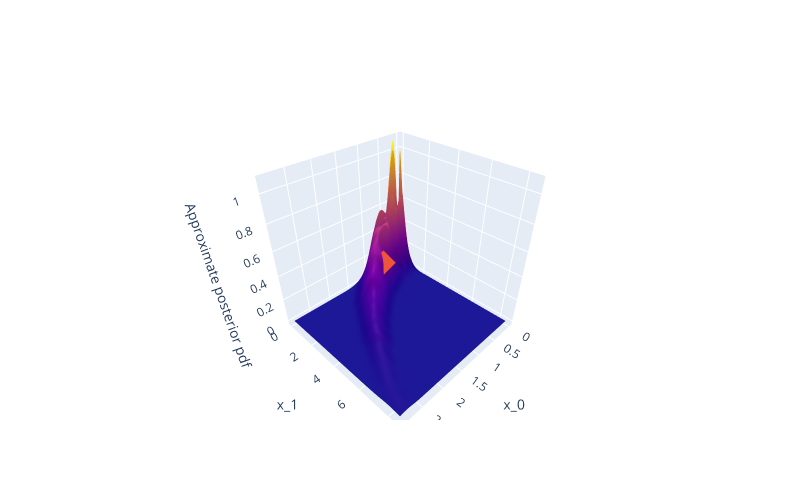

In [14]:
# Display posterior also as a non-interactive static image
from IPython.display import Image

Image(fig.to_image(format="png"))

## 5. Conclusions

In this notebook, we have discussed more in detail the input parameter settings (bounds and starting point) and the output trace of VBMC.

An important step still not considered in this example is a thorough validation of the results and diagnostics, which will be discussed in a later notebook.

## Example 2: full code

The following cell includes in a single place all the code used in Example 2, without the extra fluff.

In [15]:
assert False  # skip this cell

import numpy as np
import scipy.stats as scs
from pyvbmc.vbmc import VBMC


D = 2  # still in 2-D

# log likelihood (Rosenbrock)
def llfun(x):
    x = np.atleast_2d(x)
    return -np.sum(
        (x[0, :-1] ** 2.0 - x[0, 1:]) ** 2.0 + (x[0, :-1] - 1) ** 2.0 / 100
    )


prior_tau = 3 * np.ones((1, D))  # Length scale of the exponential prior
lpriorfun = lambda x: np.sum(scs.expon.logpdf(x, scale=prior_tau))

target = lambda x: llfun(x) + lpriorfun(x)  # Log joint


LB = np.zeros((1, D))  # Lower bounds


UB = 10 * prior_tau  # Upper bounds


PLB = scs.expon.ppf(0.159, scale=prior_tau)
PUB = scs.expon.ppf(0.841, scale=prior_tau)


x0 = np.ones((1, D))  # Optimum of the Rosenbrock function


# initialize VBMC
user_options = {"plot": True}
vbmc = VBMC(target, x0, LB, UB, PLB, PUB, user_options)
# Printing will give a summary of the vbmc object:
# bounds, user options, etc.:
print(vbmc)


# run VBMC
vp, elbo, elbo_sd, _, _ = vbmc.optimize()


lml_true = -1.836  # ground truth, which we know for this toy scenario

print("The true log model evidence is:", lml_true)
print("The obtained ELBO is:", format(elbo, ".3f"))
print("The obtained ELBO_SD is:", format(elbo_sd, ".3f"))


print(vp)


# Generate samples from the variational posterior
n_samples = int(3e5)
Xs, _ = vp.sample(n_samples)

# We compute the pdf of the approximate posterior on a 2-D grid
plot_lb = np.zeros(2)
plot_ub = np.quantile(Xs, 0.999, axis=0)
x1 = np.linspace(plot_lb[0], plot_ub[0], 400)
x2 = np.linspace(plot_lb[1], plot_ub[1], 400)

xa, xb = np.meshgrid(x1, x2)  # Build the grid
xx = np.vstack(
    (xa.ravel(), xb.ravel())
).T  # Convert grids to a vertical array of 2-D points
yy = vp.pdf(xx)  # Compute PDF values on specified points


# Plot approximate posterior pdf (this interactive plot does not work in higher D)
import plotly.graph_objects as go

fig = go.Figure(
    data=[
        go.Surface(z=yy.reshape(x1.size, x2.size), x=x1, y=x2, showscale=False)
    ]
)
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    scene=dict(
        xaxis_title="x_0",
        yaxis_title="x_1",
        zaxis_title="Approximate posterior pdf",
    ),
)

# Compute and plot approximate posterior mean
post_mean = np.mean(Xs, axis=0)
fig.add_trace(
    go.Scatter3d(
        x=[post_mean[0]],
        y=[post_mean[1]],
        z=vp.pdf(post_mean),
        name="Approximate posterior mean",
        marker_symbol="diamond",
    )
)

# Find and plot approximate posterior mode
# post_mode = vp.mode()
# fig.add_trace(go.Scatter3d(x=[post_mode[0]], y=[post_mode[1]], z=vp.pdf(post_mode), name="Approximate posterior mode", marker_symbol="x"))


# Display posterior also as a non-interactive static image
from IPython.display import Image

Image(fig.to_image(format="png"))

AssertionError: 

## Acknowledgments

Work on the `pyvbmc` package was funded by the [Finnish Center for Artificial Intelligence FCAI](https://fcai.fi/).